In [0]:
# List all tables in the database
tables_df = spark.sql("SHOW TABLES IN `hive_metastore`.`default`")
display(tables_df)

# Display the contents of the adaniports table
adaniports_df = spark.sql("SELECT * FROM `hive_metastore`.`default`.`adaniports`")
display(adaniports_df)

database,tableName,isTemporary
default,adaniports,false
default,axisbank,false


timestamp,open,high,low,close,volume
2017-01-02T03:45:00Z,269.8,270.0,268.0,268.05,12736.0
2017-01-02T03:46:00Z,268.05,268.45,267.4,267.45,13620.0
2017-01-02T03:47:00Z,267.6,267.75,267.3,267.5,13014.0
2017-01-02T03:48:00Z,267.45,267.65,267.0,267.65,11664.0
2017-01-02T03:49:00Z,267.65,268.2,267.5,268.15,6790.0
2017-01-02T03:50:00Z,268.15,268.25,267.75,268.15,4620.0
2017-01-02T03:51:00Z,268.15,268.95,268.05,268.8,6532.0
2017-01-02T03:52:00Z,268.8,268.9,268.2,268.65,6830.0
2017-01-02T03:53:00Z,268.75,268.85,268.55,268.65,2951.0
2017-01-02T03:54:00Z,268.65,269.4,268.6,269.4,9672.0


<h2>Cleaning Data</h2>

In [0]:
# Drop rows with any null values
adaniports_cleaned_df = adaniports_df.dropna()

# Remove duplicate rows
adaniports_cleaned_df = adaniports_cleaned_df.dropDuplicates()

# Drop the 'timestamp' column
#adaniports_cleaned_df = adaniports_cleaned_df.drop('timestamp')

# Display the cleaned DataFrame
adaniports_cleaned_df.printSchema()
display(adaniports_cleaned_df)

root
 |-- timestamp: timestamp (nullable = true)
 |-- open: double (nullable = true)
 |-- high: double (nullable = true)
 |-- low: double (nullable = true)
 |-- close: double (nullable = true)
 |-- volume: double (nullable = true)



timestamp,open,high,low,close,volume
2019-05-24T08:42:00Z,408.85,409.0,407.65,408.2,26376.0
2019-05-27T05:49:00Z,414.1,415.05,414.0,414.75,13798.0
2019-05-27T07:16:00Z,412.2,412.65,412.15,412.3,7904.0
2019-05-27T08:44:00Z,412.0,412.0,411.45,411.55,2615.0
2019-05-28T07:03:00Z,414.45,414.6,414.2,414.35,13799.0
2019-05-28T08:10:00Z,411.1,411.2,411.1,411.15,3009.0
2019-05-29T07:30:00Z,405.85,406.25,405.85,406.15,10504.0
2019-05-29T08:25:00Z,406.25,406.35,406.2,406.35,907.0
2019-05-30T04:42:00Z,402.1,402.65,402.1,402.35,10554.0
2019-05-31T04:11:00Z,412.6,412.65,412.05,412.05,9507.0


<h2> Analysing and visualizing data</h2>

In [0]:
!pip install mplfinance

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


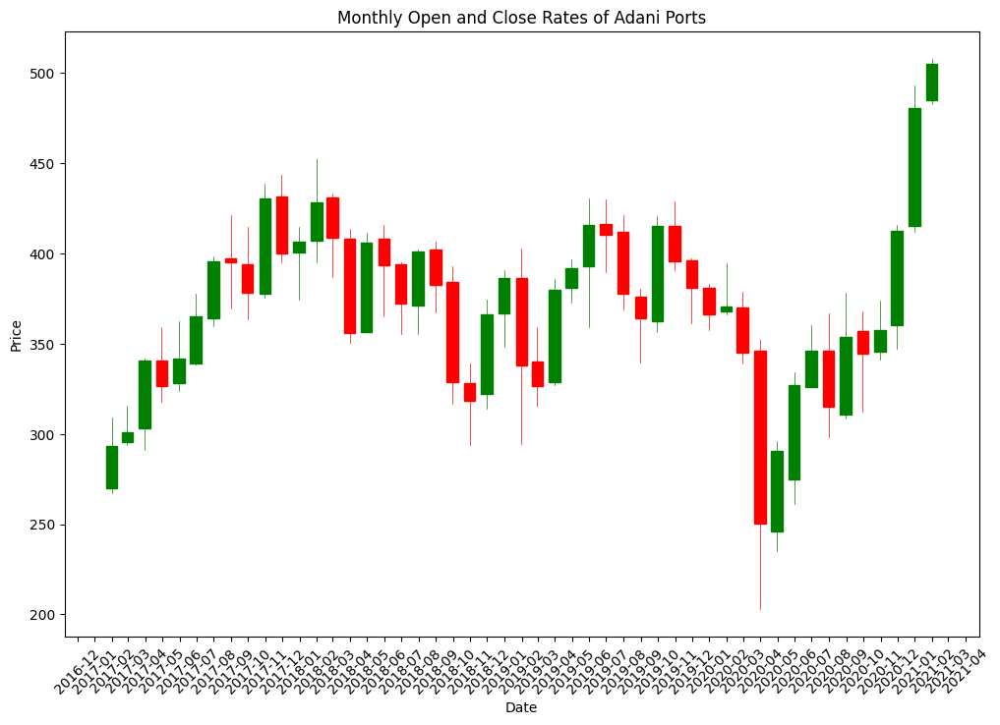

In [0]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mplfinance.original_flavor import candlestick_ohlc

# Convert Spark DataFrame to Pandas DataFrame
adaniports_cleaned_pd_df = adaniports_cleaned_df.toPandas()

# Ensure the 'date' column is in datetime format
adaniports_cleaned_pd_df['timestamp'] = pd.to_datetime(adaniports_cleaned_pd_df['timestamp'])

# Set the 'date' column as the index
adaniports_cleaned_pd_df.set_index('timestamp', inplace=True)

# Resample the data to get monthly open, high, low, and close rates
monthly_ohlc = adaniports_cleaned_pd_df['close'].resample('M').ohlc()
monthly_ohlc['open'] = adaniports_cleaned_pd_df['open'].resample('M').first()
monthly_ohlc['high'] = adaniports_cleaned_pd_df['high'].resample('M').max()
monthly_ohlc['low'] = adaniports_cleaned_pd_df['low'].resample('M').min()
monthly_ohlc['close'] = adaniports_cleaned_pd_df['close'].resample('M').last()

# Reset the index to use it for plotting
monthly_ohlc.reset_index(inplace=True)

# Convert dates to matplotlib format
monthly_ohlc['timestamp'] = monthly_ohlc['timestamp'].map(mdates.date2num)

# Plot the candlestick chart
fig, ax = plt.subplots(figsize=(12, 8))
candlestick_ohlc(ax, monthly_ohlc.values, width=20, colorup='g', colordown='r')

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title('Monthly Open and Close Rates of Adani Ports')

# Format the x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator())

# Rotate date labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

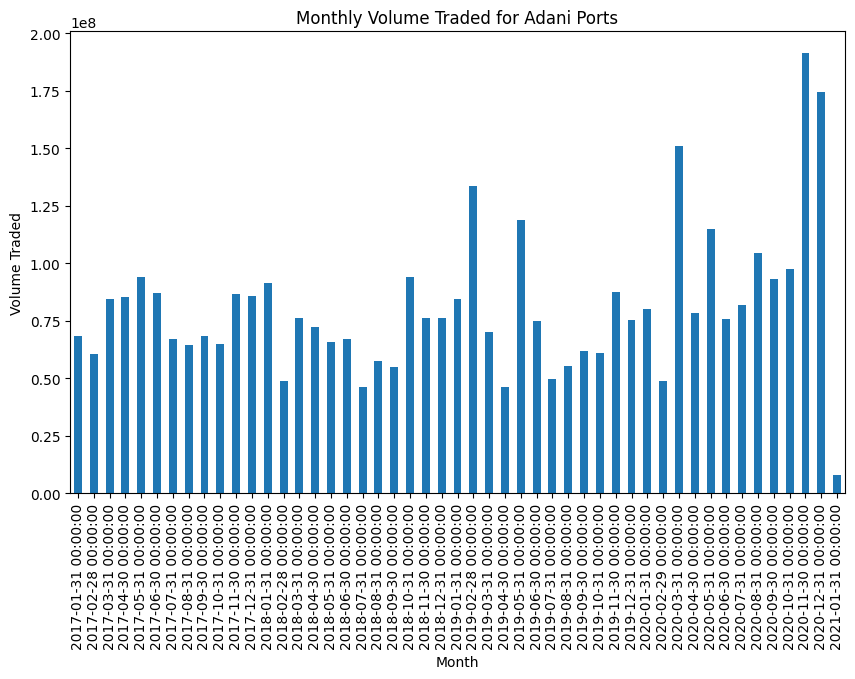

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert Spark DataFrame to Pandas DataFrame
adaniports_cleaned_pd_df = adaniports_cleaned_df.toPandas()

# Ensure the 'date' column is in datetime format
adaniports_cleaned_pd_df['timestamp'] = pd.to_datetime(adaniports_cleaned_pd_df['timestamp'])

# Set the 'date' column as the index
adaniports_cleaned_pd_df.set_index('timestamp', inplace=True)

# Resample the data to monthly frequency and sum the 'volume' column
monthly_volume = adaniports_cleaned_pd_df['volume'].resample('M').sum()

# Plot the monthly volume traded
plt.figure(figsize=(10, 6))
monthly_volume.plot(kind='bar')
plt.title('Monthly Volume Traded for Adani Ports')
plt.xlabel('Month')
plt.ylabel('Volume Traded')
plt.show()

<Axes: xlabel='timestamp'>

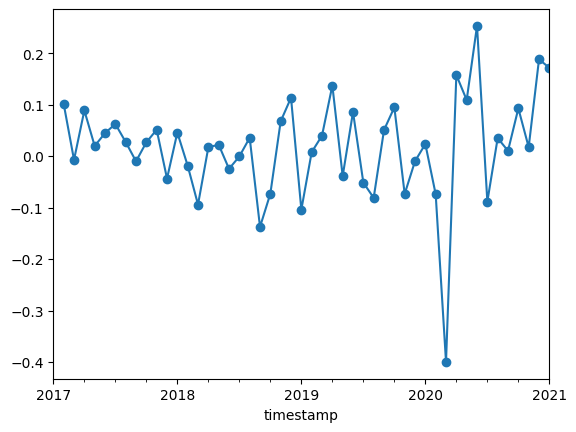

In [0]:
import seaborn as sns
monthly_return = adaniports_cleaned_pd_df['close'].resample('M').min().pct_change()
monthly_return.plot(marker='o')

/root/.ipykernel/1091/command-6280961892667662-2096885404:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(monthly_return, bins=50);


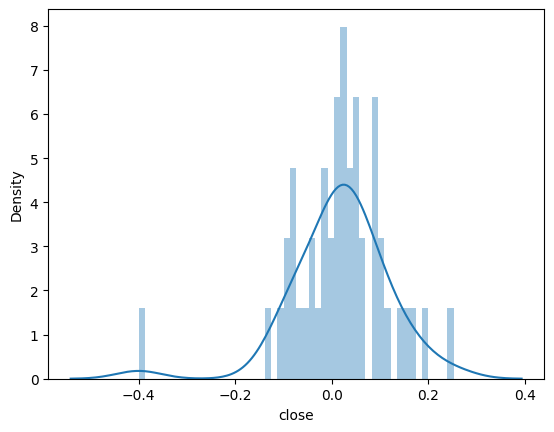

In [0]:
sns.distplot(monthly_return, bins=50);

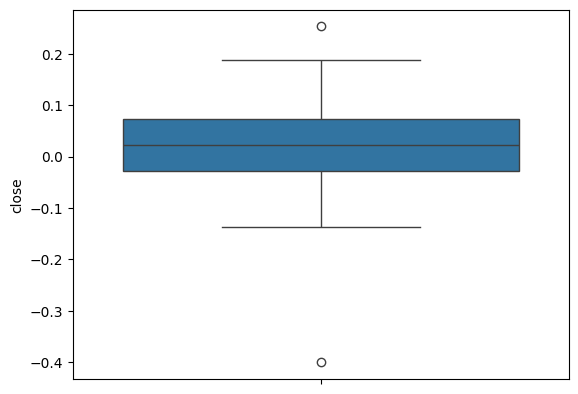

In [0]:
sns.boxplot(monthly_return);

Negative daily returns seem to be slightly more frequent than positive returns for AdaniPorts.

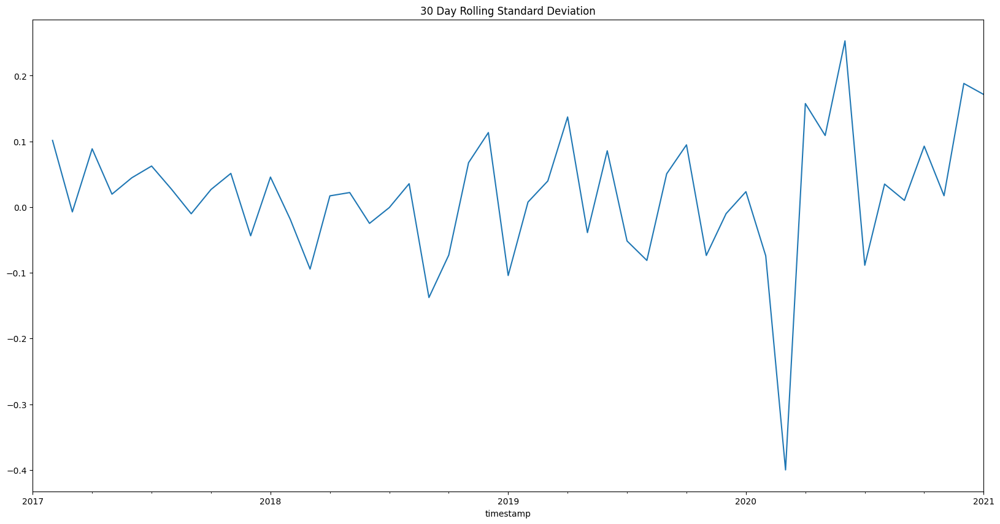

In [0]:
monthly_return.plot(figsize=(20, 10), title="30 Day Rolling Standard Deviation");

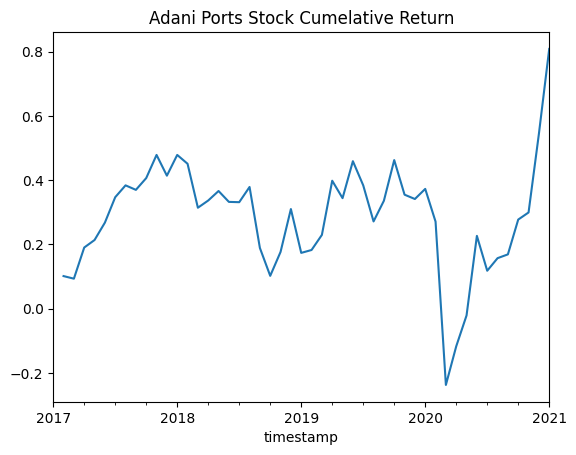

In [0]:
cumulative_return = (1+monthly_return).cumprod()-1
cumulative_return.plot()
plt.title('Adani Ports Stock Cumelative Return');

<h2> Analysing Technical Indicators </h2>

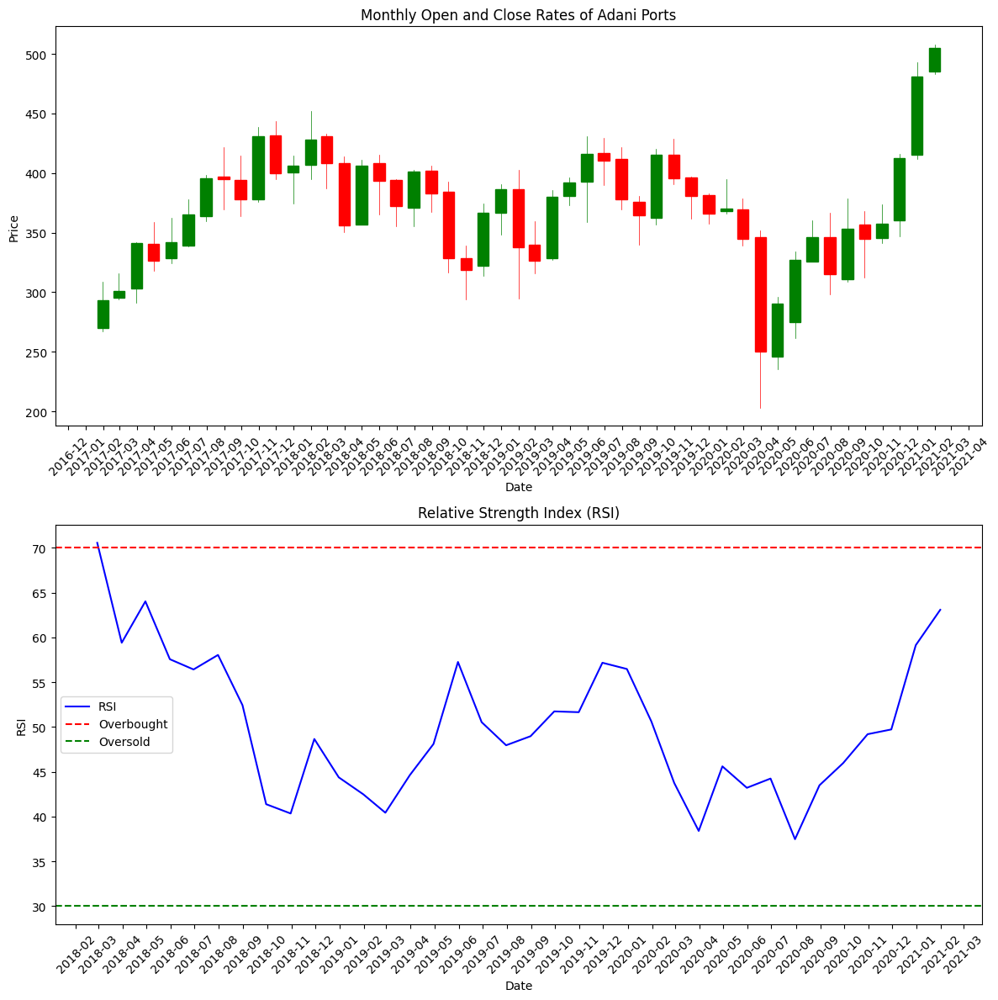

In [0]:
# Calculate Relative Strength Index (RSI) without using talib
def calculate_rsi(data, window):
    delta = data['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calculate RSI for monthly data
monthly_ohlc['rsi'] = calculate_rsi(monthly_ohlc, window=14)

# Plot the candlestick chart with RSI
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

# Plot candlestick chart
candlestick_ohlc(ax1, monthly_ohlc[['timestamp', 'open', 'high', 'low', 'close']].values, width=20, colorup='g', colordown='r')
ax1.set_xlabel('Date')
ax1.set_ylabel('Price')
ax1.set_title('Monthly Open and Close Rates of Adani Ports')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax1.xaxis.set_major_locator(mdates.MonthLocator())
plt.setp(ax1.get_xticklabels(), rotation=45)

# Plot RSI
ax2.plot(monthly_ohlc['timestamp'], monthly_ohlc['rsi'], label='RSI', color='b')
ax2.axhline(70, color='r', linestyle='--', label='Overbought')
ax2.axhline(30, color='g', linestyle='--', label='Oversold')
ax2.set_xlabel('Date')
ax2.set_ylabel('RSI')
ax2.set_title('Relative Strength Index (RSI)')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax2.xaxis.set_major_locator(mdates.MonthLocator())
plt.setp(ax2.get_xticklabels(), rotation=45)
ax2.legend()

# Display the plot
plt.tight_layout()
plt.show()

<h2>Time Series Forecasting </h2>

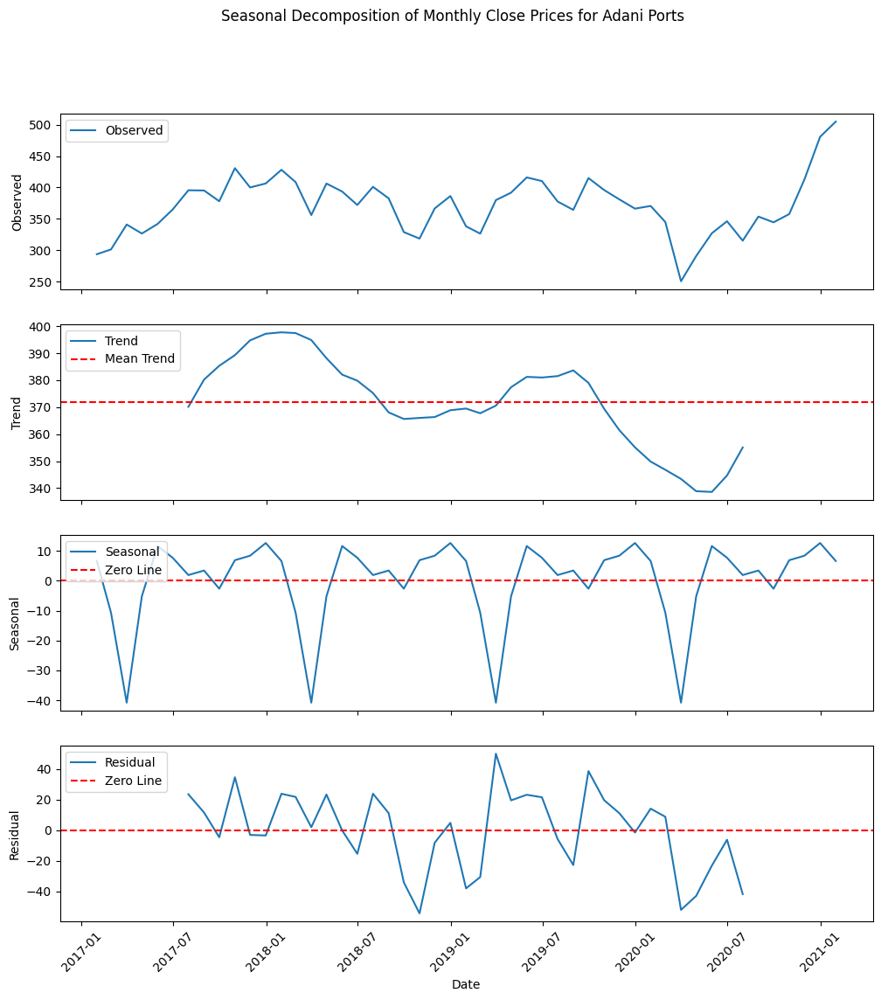

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Convert Spark DataFrame to Pandas DataFrame
adaniports_cleaned_pd_df = adaniports_cleaned_df.toPandas()

# Ensure the 'timestamp' column is in datetime format
adaniports_cleaned_pd_df['timestamp'] = pd.to_datetime(adaniports_cleaned_pd_df['timestamp'])

# Set the 'timestamp' column as the index
adaniports_cleaned_pd_df.set_index('timestamp', inplace=True)

# Resample the data to monthly frequency
monthly_data = adaniports_cleaned_pd_df.resample('M').agg({
    'open': 'first',
    'high': 'max',
    'low': 'min',
    'close': 'last',
    'volume': 'sum'
})

# Perform seasonal decomposition
decomposition = seasonal_decompose(monthly_data['close'], model='additive')

# Plot the observed, trend, seasonal, and residual components
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

# Observed
ax1.plot(decomposition.observed, label='Observed')
ax1.set_ylabel('Observed')
ax1.legend(loc='upper left')

# Trend
ax2.plot(decomposition.trend, label='Trend')
ax2.axhline(y=decomposition.trend.mean(), color='r', linestyle='--', label='Mean Trend')
ax2.set_ylabel('Trend')
ax2.legend(loc='upper left')

# Seasonal
ax3.plot(decomposition.seasonal, label='Seasonal')
ax3.axhline(y=0, color='r', linestyle='--', label='Zero Line')
ax3.set_ylabel('Seasonal')
ax3.legend(loc='upper left')

# Residual
ax4.plot(decomposition.resid, label='Residual')
ax4.axhline(y=0, color='r', linestyle='--', label='Zero Line')
ax4.set_ylabel('Residual')
ax4.legend(loc='upper left')

# Set common labels
plt.xlabel('Date')
plt.suptitle('Seasonal Decomposition of Monthly Close Prices for Adani Ports')
plt.xticks(rotation=45)
plt.show()

In [0]:
!pip install pmdarima
!pip install statsmodels

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


# **ARIMA**

In [0]:
adaniports_cleaned_df = adaniports_cleaned_df.orderBy("timestamp")
train_data, test_df = adaniports_cleaned_df.randomSplit([0.5, 0.5], seed=42)
display(train_data)
display(test_df)

timestamp,open,high,low,close,volume
2017-01-02T03:48:00Z,267.45,267.65,267.0,267.65,11664.0
2017-01-02T03:52:00Z,268.8,268.9,268.2,268.65,6830.0
2017-01-02T03:55:00Z,269.15,269.9,269.15,269.4,17496.0
2017-01-02T03:57:00Z,269.3,269.45,268.95,269.1,5983.0
2017-01-02T04:01:00Z,268.0,268.0,267.2,267.2,15995.0
2017-01-02T04:03:00Z,267.7,267.75,267.65,267.7,15975.0
2017-01-02T04:05:00Z,267.7,267.7,267.4,267.55,12182.0
2017-01-02T04:10:00Z,267.75,267.75,267.35,267.35,14721.0
2017-01-02T04:11:00Z,267.35,267.6,267.35,267.6,8630.0
2017-01-02T04:12:00Z,267.6,267.75,267.55,267.7,4162.0


timestamp,open,high,low,close,volume
2017-01-02T03:45:00Z,269.8,270.0,268.0,268.05,12736.0
2017-01-02T03:46:00Z,268.05,268.45,267.4,267.45,13620.0
2017-01-02T03:47:00Z,267.6,267.75,267.3,267.5,13014.0
2017-01-02T03:49:00Z,267.65,268.2,267.5,268.15,6790.0
2017-01-02T03:50:00Z,268.15,268.25,267.75,268.15,4620.0
2017-01-02T03:51:00Z,268.15,268.95,268.05,268.8,6532.0
2017-01-02T03:53:00Z,268.75,268.85,268.55,268.65,2951.0
2017-01-02T03:54:00Z,268.65,269.4,268.6,269.4,9672.0
2017-01-02T03:56:00Z,269.4,269.65,269.05,269.3,3908.0
2017-01-02T03:58:00Z,269.05,269.1,268.75,268.85,2160.0


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Uploading /local_disk0/repl_tmp_data/ReplId-1959c-d3a05-4/tmp3a4g4e8b/model/model.statsmodels:   0%|          …

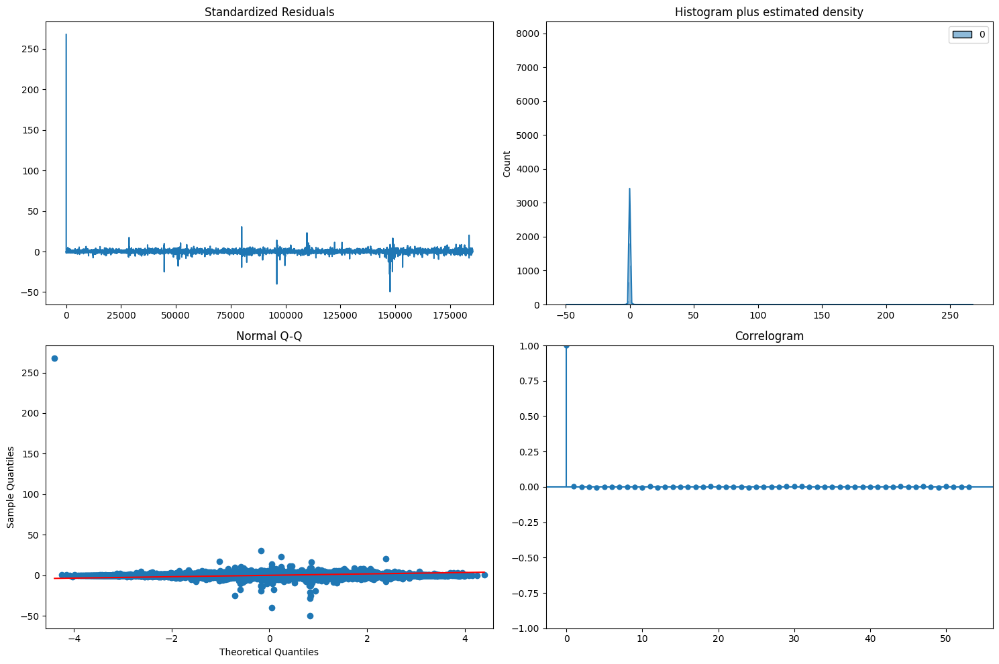

In [0]:
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Convert Spark DataFrame to Pandas DataFrame
train_data_pd = train_data.toPandas()

# Fit ARIMA model
model = ARIMA(train_data_pd['close'], order=(5,1,0))
model_fit = model.fit()

# Plotting
residuals = pd.DataFrame(model_fit.resid)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Standardized residuals
axes[0, 0].plot(residuals)
axes[0, 0].set_title('Standardized Residuals')

# Histogram plus estimated density
sns.histplot(residuals, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Histogram plus estimated density')

# Normal Q-Q plot
sm.qqplot(residuals, line='s', ax=axes[1, 0])
axes[1, 0].set_title('Normal Q-Q')

# Correlogram
sm.graphics.tsa.plot_acf(residuals.squeeze(), ax=axes[1, 1])
axes[1, 1].set_title('Correlogram')

plt.tight_layout()
plt.show()

In [0]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert Spark DataFrame to Pandas DataFrame
test_pd_df = test_df.toPandas()

# Fit SARIMAX(0, 1, 0) model
model = SARIMAX(test_pd_df['close'], order=(0, 1, 0))
results = model.fit()

display(results.summary())

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.98331D-01    |proj g|=  1.92368D-05


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      1     19      1     0     0   1.924D-05   8.983D-01
  F =  0.89833131921510023     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  close   No. Observations:               185166
Model:               SARIMAX(0, 1, 0)   Log Likelihood             -166340.417
Date:                Sun, 16 Mar 2025   AIC                         332682.834
Time:                        03:45:35   BIC                         332692.963
Sample:                             0   HQIC                        332685.825
                             - 185166                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.3530   8.61e-05   4099.635      0.000       0.353       0.353
===================================================================================
Ljung-Box (L1) (Q):                 127.02   Jarque-Bera (JB):        1006538852.86
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.66   Skew:                            -4.03
Prob(H) (two-sided):                  0.00   Kurtosis:                       364.11
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<module 'matplotlib.pyplot' from '/databricks/python/lib/python3.12/site-packages/matplotlib/pyplot.py'>

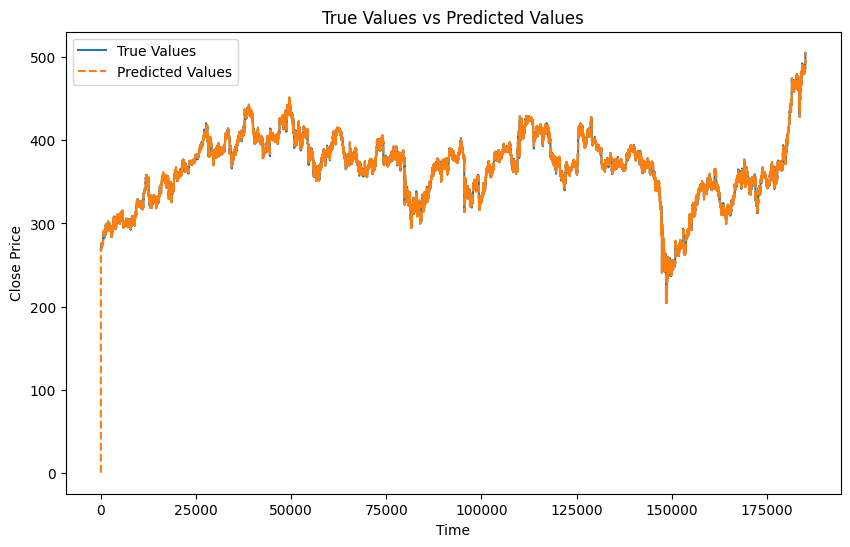

In [0]:
# Obtain predicted values
predictions = results.get_prediction(start=0, end=len(test_pd_df)-1)
predicted_values = predictions.predicted_mean

# Create a DataFrame with true values and predicted values
import pandas as pd

comparison_df = pd.DataFrame({
    "True Values": test_pd_df["close"].values,
    "Predicted Values": predicted_values
})

# Convert the comparison DataFrame to a Spark DataFrame
comparison_sdf = spark.createDataFrame(comparison_df)

# Plot graph of predictions against known values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(test_pd_df.index, test_pd_df["close"], label="True Values")
plt.plot(test_pd_df.index, predicted_values, label="Predicted Values", linestyle='dashed')
plt.legend(loc="upper left")
plt.xlabel("Time")
plt.ylabel("Close Price")
plt.title("True Values vs Predicted Values")
display(plt)

In [0]:
# Evaluate the ARIMA model by calculating additional metrics

from pyspark.sql.functions import sqrt, avg, col

# Calculate RMSE
rmse = comparison_sdf.withColumn("squared_error", (col("True Values") - col("Predicted Values")) ** 2) \
                     .agg(sqrt(avg(col("squared_error"))).alias("RMSE")) \
                     .select("RMSE") \
                     .collect()[0]["RMSE"]
                     
from pyspark.sql.functions import abs

# Calculate MAE
mae = comparison_sdf.withColumn("absolute_error", abs(col("True Values") - col("Predicted Values"))) \
                    .agg(avg(col("absolute_error")).alias("MAE")) \
                    .select("MAE") \
                    .collect()[0]["MAE"]

# Calculate MAPE
mape = comparison_sdf.withColumn("percentage_error", abs((col("True Values") - col("Predicted Values")) / col("True Values"))) \
                     .agg(avg(col("percentage_error")).alias("MAPE")) \
                     .select("MAPE") \
                     .collect()[0]["MAPE"]

# Display the evaluation metrics
evaluation_metrics = pd.DataFrame({
    "Metric": ["RMSE", "MAE", "MAPE"],
    "Value": [rmse, mae, mape]
})

evaluation_metrics_sdf = spark.createDataFrame(evaluation_metrics)
display(evaluation_metrics_sdf)

Metric,Value
RMSE,0.8608494351495267
MAE,0.33512955942233885
MAPE,9.342419071119026E-4


In [0]:
from pyspark.sql.functions import when, count

# Add a column to indicate correct predictions (True if the sign of the prediction matches the sign of the true value)
comparison_sdf = comparison_sdf.withColumn("correct_prediction", when((col("True Values") > 0) & (col("Predicted Values") > 0), 1)
                                           .when((col("True Values") <= 0) & (col("Predicted Values") <= 0), 1)
                                           .otherwise(0))

# Calculate accuracy
accuracy = comparison_sdf.agg((count(when(col("correct_prediction") == 1, True)) / count("*")).alias("accuracy")) \
                         .select("accuracy") \
                         .collect()[0]["accuracy"]

# Add a column to indicate positive predictions
comparison_sdf = comparison_sdf.withColumn("positive_prediction", when(col("Predicted Values") > 0, 1).otherwise(0))

# Calculate precision
precision = comparison_sdf.agg((count(when((col("correct_prediction") == 1) & (col("positive_prediction") == 1), True)) / 
                                count(when(col("positive_prediction") == 1, True))).alias("precision")) \
                          .select("precision") \
                          .collect()[0]["precision"]

# Display the accuracy and precision
evaluation_metrics = pd.DataFrame({
    "Metric": ["Accuracy", "Precision"],
    "Value": [accuracy, precision]
})

evaluation_metrics_sdf = spark.createDataFrame(evaluation_metrics)
display(evaluation_metrics_sdf)

Metric,Value
Accuracy,0.9999945994405021
Precision,1.0


# **LSTM**

In [0]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from pyspark.sql.functions import col

# Convert Spark DataFrames to Pandas DataFrames
train_pd = train_data.select("timestamp", "close").toPandas()
test_pd = test_df.select("timestamp", "close").toPandas()

# Set the timestamp as the index
train_pd.set_index("timestamp", inplace=True)
test_pd.set_index("timestamp", inplace=True)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
train_scaled = scaler.fit_transform(train_pd)
test_scaled = scaler.transform(test_pd)

# Create sequences for LSTM
def create_sequences(data, seq_length):
    sequences = []
    labels = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i:i + seq_length])
        labels.append(data[i + seq_length])
    return np.array(sequences), np.array(labels)

seq_length = 10
X_train, y_train = create_sequences(train_scaled, seq_length)
X_test, y_test = create_sequences(test_scaled, seq_length)

# Build LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(seq_length, 1)))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_test, y_test))

# Make predictions
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Inverse transform the predictions
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)

# Create DataFrames for predictions
train_predictions_df = pd.DataFrame(train_predictions, index=train_pd.index[seq_length:], columns=["Predicted Close"])
test_predictions_df = pd.DataFrame(test_predictions, index=test_pd.index[seq_length:], columns=["Predicted Close"])

# Convert to Spark DataFrames
train_predictions_sdf = spark.createDataFrame(train_predictions_df)
test_predictions_sdf = spark.createDataFrame(test_predictions_df)

# Display the predictions
display(train_predictions_sdf)
display(test_predictions_sdf)

Epoch 1/5


/databricks/python/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 961/57

*** WARNING: max output size exceeded, skipping output. ***

5785/5785 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step


Predicted Close
266.92313
266.72974
266.64523
266.70584
266.58664
266.6534
266.70554
266.7131
266.87943
266.82126


Predicted Close
268.09174
267.74084
267.24326
266.97412
266.9885
266.87717
266.8575
266.89264
266.9717
266.89163


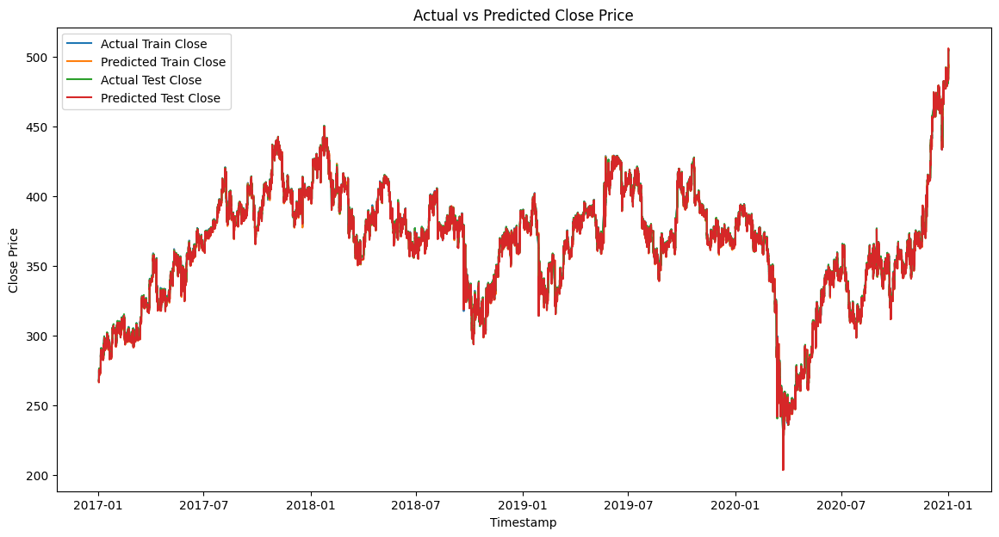

In [0]:
import matplotlib.pyplot as plt

# Convert Spark DataFrames to Pandas DataFrames for plotting
train_actual_pd = train_data.select("timestamp", "close").toPandas()
test_actual_pd = test_df.select("timestamp", "close").toPandas()

# Set the timestamp as the index
train_actual_pd.set_index("timestamp", inplace=True)
test_actual_pd.set_index("timestamp", inplace=True)

# Plot the actual vs predicted values
plt.figure(figsize=(14, 7))

# Plot training data
plt.plot(train_actual_pd.index, train_actual_pd["close"], label="Actual Train Close")
plt.plot(train_predictions_df.index, train_predictions_df["Predicted Close"], label="Predicted Train Close")

# Plot test data
plt.plot(test_actual_pd.index, test_actual_pd["close"], label="Actual Test Close")
plt.plot(test_predictions_df.index, test_predictions_df["Predicted Close"], label="Predicted Test Close")

plt.xlabel("Timestamp")
plt.ylabel("Close Price")
plt.title("Actual vs Predicted Close Price")
plt.legend()
plt.show()

In [0]:
predictions = model.predict(X_test)

from pyspark.sql.functions import monotonically_increasing_id
predictions_df = spark.createDataFrame(pd.DataFrame(predictions, columns=["prediction"]))
true_values_df = spark.createDataFrame(pd.DataFrame(y_test, columns=["label"]))

# Combine predictions and true values into a single DataFrame
combined_df = predictions_df.withColumn("id", monotonically_increasing_id()).join(
    true_values_df.withColumn("id", monotonically_increasing_id()), "id"
).drop("id")

# Evaluate the model using RegressionEvaluator for RMSE
from pyspark.ml.evaluation import RegressionEvaluator

evaluator = RegressionEvaluator(
    labelCol="label", 
    predictionCol="prediction", 
    metricName="rmse"
)

rmse = evaluator.evaluate(combined_df)

print(f"RMSE = {rmse}")


2753/5785 ━━━━━━━━━

*** WARNING: max output size exceeded, skipping output. ***

5785/5785 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step
RMSE = 0.0028010651080473256


In [0]:
combined_df = combined_df.withColumn("binary_prediction", (col("prediction") > 0.5).cast("int"))
combined_df = combined_df.withColumn("binary_label", (col("label") > 0.5).cast("int"))

true_positives = combined_df.filter((col("binary_prediction") == 1) & (col("binary_label") == 1)).count()
true_negatives = combined_df.filter((col("binary_prediction") == 0) & (col("binary_label") == 0)).count()
false_positives = combined_df.filter((col("binary_prediction") == 1) & (col("binary_label") == 0)).count()
false_negatives = combined_df.filter((col("binary_prediction") == 0) & (col("binary_label") == 1)).count()

accuracy = (true_positives + true_negatives) / (true_positives + true_negatives + false_positives + false_negatives)
precision = true_positives / (true_positives + false_positives)


print(f"Accuracy = {accuracy}")
print(f"Precision = {precision}")

Accuracy = 0.9936145730353467
Precision = 0.9996371143331775


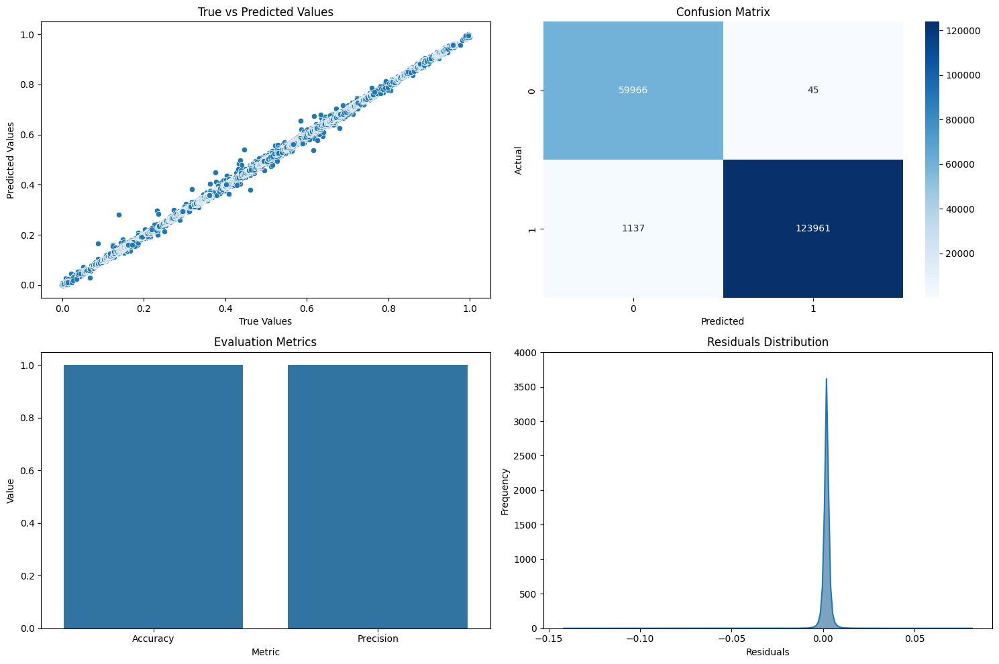

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert Spark DataFrames to Pandas DataFrames for visualization
combined_pd_df = combined_df.toPandas()
evaluation_metrics_pd_df = evaluation_metrics_sdf.toPandas()

# Set up the dashboard layout
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: True vs Predicted Values
sns.scatterplot(data=combined_pd_df, x='label', y='prediction', ax=axes[0, 0])
axes[0, 0].set_title('True vs Predicted Values')
axes[0, 0].set_xlabel('True Values')
axes[0, 0].set_ylabel('Predicted Values')

# Plot 2: Confusion Matrix
confusion_matrix = pd.crosstab(combined_pd_df['binary_label'], combined_pd_df['binary_prediction'], rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0, 1])
axes[0, 1].set_title('Confusion Matrix')

# Plot 3: Evaluation Metrics
sns.barplot(data=evaluation_metrics_pd_df, x='Metric', y='Value', ax=axes[1, 0])
axes[1, 0].set_title('Evaluation Metrics')
axes[1, 0].set_xlabel('Metric')
axes[1, 0].set_ylabel('Value')

# Plot 4: Residuals Distribution
residuals = combined_pd_df['label'] - combined_pd_df['prediction']
sns.histplot(residuals, kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Residuals Distribution')
axes[1, 1].set_xlabel('Residuals')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()